# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="https://github.com/hse-aml/intro-to-dl-pytorch/blob/main/week06/images/encoder_decoder.png?raw=1" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

Alright, here's our plan:
* Take a pre-trained inception v3 to vectorize images
* Stack an LSTM on top of it
* Train the thing on MSCOCO

## Importing stuff and preparing data

In [1]:
%%bash

shred -u setup_colab.py

wget https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py -O setup_colab.py

--2021-11-23 11:05:49--  https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1649 (1.6K) [text/plain]
Saving to: ‘setup_colab.py’

     0K .                                                     100% 11.1M=0s

2021-11-23 11:05:49 (11.1 MB/s) - ‘setup_colab.py’ saved [1649/1649]



In [2]:
! nvidia-smi

Tue Nov 23 11:05:52 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
import setup_colab

setup_colab.setup_week06()

In [4]:
import grading
import grading_utils

grader = grading.Grader(
    assignment_key="NEDBg6CgEee8nQ6uE8a7OA",
    all_parts=["19Wpv", "E2OIL", "rbpnH", "YJR7z"]
)

In [5]:
# token expires every 30 min
COURSERA_TOKEN = "Wopjr4ryGytpp4Fk"
COURSERA_EMAIL = "svafanasev@gmail.com"

In [6]:
%%time

# Load dataset (vectorized images and captions)
import numpy as np
import json

img_codes = np.load("data/image_codes.npy")
captions = json.load(open('data/captions_tokenized.json'))

CPU times: user 162 ms, sys: 484 ms, total: 646 ms
Wall time: 647 ms


In [7]:
print("Each image code is a 2048-unit vector [ shape: %s ]" % str(img_codes.shape))
print(img_codes[0,:10], end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 2048-unit vector [ shape: (118287, 2048) ]
[0.3659946  0.2016555  0.9245725  0.57063824 0.547268   0.8275868
 0.3687277  0.12085301 0.0561931  0.49758485]

For each image there are 5 reference captions, e.g.:

people shopping in an open market for vegetables .
an open market full of people and piles of vegetables .
people are shopping at an open air produce market .
large piles of carrots and potatoes at a crowded outdoor market .
people shop for vegetables like carrots and potatoes at an open air market .


As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [8]:
# split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"] + sentence.split(' ') + ["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to count the occurences of each word so that we can decide which words to keep in our vocabulary.

In [9]:
from itertools import chain

# Build a Vocabulary
from collections import Counter
word_counts = Counter()

# Compute word frequencies for each word in captions. See code above for data structure

# YOUR CODE HERE
word_counts = Counter(chain(*chain(*captions)))

In [10]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [11]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab))

In [23]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


In [12]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [13]:
# Try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   24,  262,  140,    6,  159,   14,   24,  858,  155,   12,
           2,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   53,   18,   24,  858,  155,    2,    3,    3,
           3,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   41,   18,  903,   35,  620,  155,    2,    3,
           3,    3,    3,    3,    3,    3,    3,    3],
       [   1,   45,  115,  262,   41,   53,   18,  620, 1525,   77,   12,
           2,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   53,   18,   24,  858,  123,   58,   45,  276,
        3641,   24, 3642,   35,   45, 1128,   12,    2]], dtype=int32)

In [14]:
# Try it out on several descriptions of a random image
as_matrix(captions[133])

array([[   1,  139,  148,  146,   45,   97,  193,  117,   24,  268,   12,
           2,    3],
       [   1,   24,  139,  148,  193,  117,  109,  149,   35,  394,   97,
           2,    3],
       [   1,   24,  139,   41,    0,   35,   24,  394,  200,   12,    2,
           3,    3],
       [   1,   24,   46,  139,   41,   35,  367,   58, 1104,   35,  493,
         331,    2],
       [   1,   24,  148,  139,   41,  148,   35,   24,  394,   97,   12,
           2,    3]], dtype=int32)

## Building our neural network
As we mentioned earlier, we shall build an rnn "language-model" conditioned on vectors from the convolutional part.

<img src="https://github.com/yunjey/pytorch-tutorial/raw/master/tutorials/03-advanced/image_captioning/png/model.png" style="width:70%">

In [15]:
import torch
from torch import nn
import torch.nn.functional as F

In [16]:
class CaptionNet(nn.Module):
    
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048):
        """ A recurrent 'head' network for image captioning. See scheme above. """
        super().__init__()
        
        # a layer that converts conv features to initial_h (h_0) and initial_c (c_0)
        self.cnn_to_h0 = nn.Linear(cnn_feature_size, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_feature_size, lstm_units)

        # create embedding for input words. Use the parameters (e.g. emb_size).
        # YOUR CODE HERE
        self.embedding = nn.Embedding(n_tokens, emb_size)
            
        # lstm: create a recurrent core of your network. Use either LSTMCell or just LSTM. 
        # In the latter case (nn.LSTM), make sure batch_first=True
        # YOUR CODE HERE
        self.lstm = nn.LSTM(input_size=emb_size, hidden_size=lstm_units, batch_first=True)
            
        # create logits: linear layer that takes lstm hidden state as input and computes one number per token
        # YOUR CODE HERE
        self.logits = nn.Linear(lstm_units, n_tokens)
        
    def forward(self, image_vectors, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_vectors: torch tensor containing inception vectors. shape: [batch, cnn_feature_size]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """

        self.lstm.flatten_parameters()

        initial_cell = self.cnn_to_c0(image_vectors)
        initial_hid = self.cnn_to_h0(image_vectors)
        
        # compute embeddings for captions_ix
        # YOUR CODE HERE
        captions_emb = self.embedding(captions_ix)
        
        # apply recurrent layer to captions_emb. 
        # 1. initialize lstm state with initial_* from above
        # 2. feed it with captions. Mind the dimension order in docstring
        # 3. compute logits for next token probabilities
        # Note: if you used nn.LSTM, you can just give it (initial_cell[None], initial_hid[None]) as second arg

        # lstm_out should be lstm hidden state sequence of shape [batch, caption_length, lstm_units]
        # YOUR CODE HERE
        out, hidden = self.lstm(captions_emb, (initial_cell[None], initial_hid[None]))
        
        # compute logits from lstm_out
        # YOUR CODE HERE
        logits = self.logits(out)

        return logits

In [17]:
network = CaptionNet(n_tokens)

In [18]:
dummy_img_vec = torch.randn(len(captions[0]), 2048)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits = network.forward(dummy_img_vec, dummy_capt_ix)

print('shape:', dummy_logits.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)

shape: torch.Size([5, 16, 10403])


In [19]:
def compute_loss(network, image_vectors, captions_ix):
    """
    :param image_vectors: torch tensor containing inception vectors. shape: [batch, cnn_feature_size]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones. Scalar float tensor
    """
    
    # captions for input - all except last because we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions for captions_ix_next
    logits_for_next = network.forward(image_vectors, captions_ix_inp)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask!
    # Make sure that predicting next tokens after EOS do not contribute to loss
    # You can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    # YOUR CODE HERE
    return F.cross_entropy(logits_for_next.reshape(-1, logits_for_next.size(-1)), 
                           captions_ix_next.reshape(-1), ignore_index=pad_ix)

In [20]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.data.numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
    'loss should depend differentiably on all neural network weights'

In [21]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("rbpnH", grading_utils.test_network(network))

In [22]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


## Batch generator

In [24]:
from sklearn.model_selection import train_test_split

captions = np.array(captions)
train_img_codes, val_img_codes, train_captions, val_captions = train_test_split(
    img_codes, captions, test_size=0.1, random_state=42
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  This is separate from the ipykernel package so we can avoid doing imports until


In [25]:
from random import choice

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    # sample random numbers for image/caption indicies
    random_image_ix = np.random.randint(0, len(img_codes), size=batch_size)
    
    # get images
    batch_images = img_codes[random_image_ix]
    
    # 5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    # pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    # convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), \
        torch.tensor(batch_captions_ix, dtype=torch.int64)

In [26]:
generate_batch(img_codes, captions, 3)

(tensor([[0.0761, 0.3029, 0.7229,  ..., 1.0379, 0.2701, 0.0087],
         [0.0201, 0.6585, 0.1702,  ..., 0.6206, 0.5167, 0.2956],
         [0.2895, 0.1528, 0.0289,  ..., 0.4713, 0.4176, 0.6052]]),
 tensor([[   1,   88, 1487,  155, 3311,  140,   35,   77,   14,   24,  154,   12,
             2],
         [   1,   24,  989,   35,   24,   79,  306,  459,   45,   19,   12,    2,
             3],
         [   1,  652,  379,   17,   94,    0,    6,   24,   65,   12,    2,    3,
             3]]))

In [27]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("E2OIL", grading_utils.test_batch(generate_batch(img_codes, captions, 3)))

In [ ]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

## Train and validate loop

In [28]:
#from tqdm import tqdm_notebook
from IPython.display import clear_output
from tqdm.notebook import tqdm


In [29]:
DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [30]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 160
n_batches_per_epoch = 50
n_validation_batches = 5  # how many batches are used for validation after each epoch

In [31]:
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


Epoch: 159, train loss: 2.3939133405685427, val loss: 2.422291374206543
Finished!


In [32]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("YJR7z", val_loss)

In [35]:
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


## Generating caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [33]:
from beheaded_inception3 import beheaded_inception_v3

inception = beheaded_inception_v3().eval()

def generate_caption(image, network, caption_prefix = ('#START#',), t=1, sample=True, max_len=100):
    network = network.cpu().eval()

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >= 0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_8x8, vectors_neck, logits = inception(image[None])
    caption_prefix = list(caption_prefix)
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        next_word_logits = network.forward(vectors_neck, prefix_ix)[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().numpy()
        
        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word == '#END#':
            break

    return ' '.join(caption_prefix[1:-1])

/usr/local/lib/python3.7/dist-packages/torchvision/models/inception.py:83: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  ' due to scipy/scipy#11299), please set init_weights=True.', FutureWarning)
Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

In [34]:
import matplotlib.pyplot as plt
from skimage.transform import resize

# sample image
! wget https://avatars.mds.yandex.net/get-zen_doc/1578906/pub_5deb7d24a06eaf00af983448_5deb7d6643863f00ae06dc24/scale_1200 -O data/img.jpg

--2021-11-23 11:13:12--  https://avatars.mds.yandex.net/get-zen_doc/1578906/pub_5deb7d24a06eaf00af983448_5deb7d6643863f00ae06dc24/scale_1200
Resolving avatars.mds.yandex.net (avatars.mds.yandex.net)... 87.250.247.182, 87.250.247.181, 87.250.247.184, ...
Connecting to avatars.mds.yandex.net (avatars.mds.yandex.net)|87.250.247.182|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 127270 (124K) [image/jpeg]
Saving to: ‘data/img.jpg’

data/img.jpg        100%[===================>] 124.29K   255KB/s    in 0.5s    

2021-11-23 11:13:13 (255 KB/s) - ‘data/img.jpg’ saved [127270/127270]



a cat is sitting on a table with a cat .
a cat is sitting on a table with a cat .
a cat is sitting on a table with a cat .
a cat is sitting on a table .
a cat is sitting on a table .


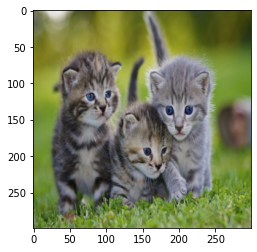

In [47]:
img = plt.imread("data/img.jpg")
img = resize(img, (299, 299))

plt.imshow(img)

for i in range(5):
    print(generate_caption(img, network, t=5.0))

# Staff graded assignment tasks

Now you are going to train the network and estimate it's quality on checkpoints.

1. Train the network for 6 epoches (set n_batches_per_epoch to such value, that with batch_size you iterate over the whole dataset at one epoch, you should increase n_validation_batches to validate more accurately), find good and bad annotation examples. What loss values have you achieved?
1. Continue training until 12 epoch. What happened to the loss value? Search for examples, that have improved their captions in comparison to 6 epoch training.
1. Train the network until convergence. How many epoches do you need?
1. Mobile devices are not very powerfull. Try reducing network size (emb_size=64, lstm_units=128), how it affected network quality after 12 epoches in comparison to original network? And visually?
1. Collect at least 10 images that you like to test our network on.
    - Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
    - Make sure it works okay on simple images before going to something more complex
    - Photos, not animation/3d/drawings, unless you want to train CNN network on anime
    - Mind the aspect ratio
    - Photos should not be from MSCOCO! Collect some data yourself, take anything you find worth testing on

### Training tips

* If training loss has become close to 0 or model produces garbage, double-check that you're predicting next words, not current or t+2'th words
* If the model generates fluent captions that have nothing to do with the images
    * this may be due to recurrent net not receiving image vectors.
    * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
    * finally, you may just need to train the model a bit more
* Crossentropy is a poor measure of overfitting
    * Model can overfit validation crossentropy but keep improving validation quality.
    * Use human (manual) evaluation or try automated metrics: cider or bleu
    
* We recommend you to periodically evaluate the network using the next "apply trained model" block
    * its safe to interrupt training, run a few examples and start training again
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=2.8 ~ 3.0

## Images to test on

We have downloaded 30 images from validation set of MSCOCO, they are located in `data` folder and named `img_i.jpg` for i from 0 to 29. You should use them to measure your network quality during checkpoints.

In [36]:
### READ IMAGES FROM DISK
test_img = [resize(plt.imread(f"data/img_{i}"), (299, 299)) for i in range(30)]

In [37]:
n_train = len(train_img_codes)
n_test = len(test_img)

print(f"N_train = {n_train}")
print(f"N_test = {n_test}")

N_train = 106458
N_test = 30


## First task

Train the network for 6 epoches (set n_batches_per_epoch to such value, that with batch_size you iterate over the whole dataset at one epoch, you should increase n_validation_batches to validate more accurately), find good and bad annotation examples. What loss values have you achieved?

In [38]:
from collections import defaultdict
from textwrap import fill

In [39]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)

def generate_batch_img_idx(img_codes, img_idx, captions, max_caption_len=None):
    batch_images = img_codes[img_idx]
    captions_for_batch_images = captions[img_idx]
    batch_captions = list(map(choice, captions_for_batch_images))
    batch_captions_ix = as_matrix(batch_captions, max_len=max_caption_len)

    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

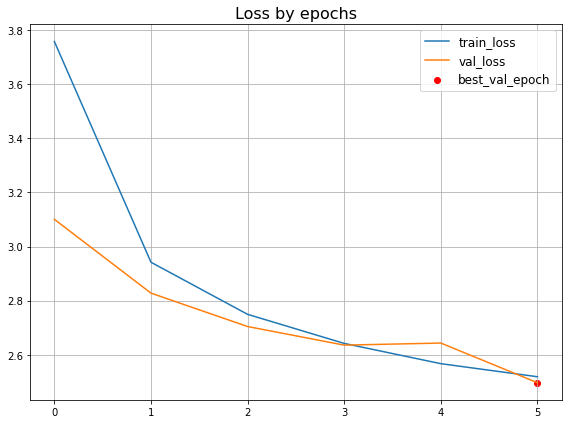

		|   #	| train_loss | val_loss
-------------------------------------------------
Last epoch 	|   6	|   2.5185   |  2.4963
The best epoch 	|   6	|   2.5185   |  2.4963


In [40]:
HISTORY_1 = defaultdict(list)

n_epochs = 6
n_validation_batches = 8
network_graded_1 = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network_graded_1.parameters(), lr=1e-3)

for epoch in range(n_epochs):
    train_img_indices = list(range(n_train))
    np.random.shuffle(train_img_indices)
    batches = np.array_split(train_img_indices, n_train // batch_size)

    train_loss = 0
    network_graded_1.train()
    for batch in batches:
        images, captions = generate_batch_img_idx(train_img_codes, batch, train_captions)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network_graded_1, images, captions)

        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()

        train_loss += loss_t.detach().cpu().numpy()

    train_loss /= len(batches)
    HISTORY_1["train_loss"].append(train_loss)

    val_loss = 0
    network_graded_1.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        with torch.no_grad():
            loss_t = compute_loss(network_graded_1, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    HISTORY_1["val_loss"].append(val_loss)

    HISTORY_1["model_params"].append(network_graded_1.state_dict())

    best_epoch_ = np.argmin(HISTORY_1["val_loss"])

    clear_output()
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    ax.set_title("Loss by epochs", fontsize=16)
    ax.plot(HISTORY_1["train_loss"], label="train_loss")
    ax.plot(HISTORY_1["val_loss"], label="val_loss")
    ax.scatter(x=best_epoch_, y=HISTORY_1["val_loss"][best_epoch_], label="best_val_epoch", color="red")
    ax.grid()
    ax.legend(fontsize=12)

    plt.tight_layout()
    plt.show()

last_tr_loss = round(HISTORY_1["train_loss"][epoch], 4)
last_val_loss = round(HISTORY_1["val_loss"][epoch], 4)
best_tr_loss = round(HISTORY_1["train_loss"][best_epoch_], 4)
best_val_loss = round(HISTORY_1["val_loss"][best_epoch_], 4)

print("\t\t|   #\t| train_loss | val_loss")
print("-------------------------------------------------")
print(f"Last epoch \t|   {epoch + 1}\t|   {last_tr_loss}   |  {last_val_loss}")
print(f"The best epoch \t|   {best_epoch_ + 1}\t|   {best_tr_loss}   |  {best_val_loss}")

In [42]:
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)

for i in range(n_test):
    img_caption = generate_caption(test_img[i], network_graded_1, t=5.0)
    print(f"Image_{i+1} caption:", img_caption)


Image_1 caption: a bus driving down a street next to a building .
Image_2 caption: a black bear walking through a grassy area .
Image_3 caption: a table with a glass of wine on it .
Image_4 caption: a cat sitting on a bench next to a window .
Image_5 caption: a man standing on a cell phone in front of a building .
Image_6 caption: a woman is riding a horse in a field .
Image_7 caption: a man is flying a kite on a beach .
Image_8 caption: a clock tower with a clock on top of it .
Image_9 caption: a woman is sitting on a couch with a remote .
Image_10 caption: a woman sitting on a bench with a car .
Image_11 caption: a group of people sitting around a table with laptops .
Image_12 caption: a young boy is playing with a ball in the grass .
Image_13 caption: a woman sitting at a table with a cake on a table .
Image_14 caption: a group of people in a kitchen with a refrigerator .
Image_15 caption: a bathroom with a toilet and a sink and a toilet .
Image_16 caption: a giraffe standing next t

## Second task

Continue training until 12 epoch. What happened to the loss value? Search for examples, that have improved their captions in comparison to 6 epoch training.

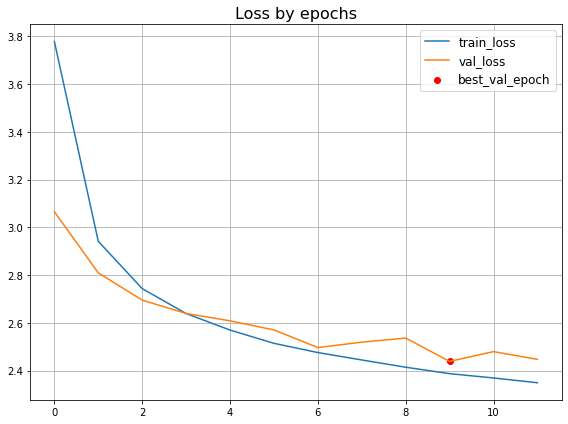

		|   #	| train_loss | val_loss
-------------------------------------------------
Last epoch 	|   12	|   2.349   |  2.4468
The best epoch 	|   10	|   2.387   |  2.4384


In [43]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)

HISTORY_2 = defaultdict(list)

n_epochs = 12
n_validation_batches = 16
network_graded_2 = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network_graded_2.parameters(), lr=1e-3)


for epoch in range(n_epochs):
    train_img_indices = list(range(n_train))
    np.random.shuffle(train_img_indices)
    batches = np.array_split(train_img_indices, n_train // batch_size)

    train_loss = 0
    network_graded_2.train()
    for batch in batches:
        images, captions = generate_batch_img_idx(train_img_codes, batch, train_captions)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network_graded_2, images, captions)

        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()

        train_loss += loss_t.detach().cpu().numpy()

    train_loss /= len(batches)
    HISTORY_2["train_loss"].append(train_loss)

    val_loss = 0
    network_graded_2.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        with torch.no_grad():
            loss_t = compute_loss(network_graded_2, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    HISTORY_2["val_loss"].append(val_loss)

    HISTORY_2["model_params"].append(network_graded_2.state_dict())

    best_epoch_ = np.argmin(HISTORY_2["val_loss"])

    clear_output()
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    ax.set_title("Loss by epochs", fontsize=16)
    ax.plot(HISTORY_2["train_loss"], label="train_loss")
    ax.plot(HISTORY_2["val_loss"], label="val_loss")
    ax.scatter(x=best_epoch_, y=HISTORY_2["val_loss"][best_epoch_], label="best_val_epoch", color="red")
    ax.grid()
    ax.legend(fontsize=12)

    plt.tight_layout()
    plt.show()

last_tr_loss = round(HISTORY_2["train_loss"][epoch], 4)
last_val_loss = round(HISTORY_2["val_loss"][epoch], 4)
best_tr_loss = round(HISTORY_2["train_loss"][best_epoch_], 4)
best_val_loss = round(HISTORY_2["val_loss"][best_epoch_], 4)

print("\t\t|   #\t| train_loss | val_loss")
print("-------------------------------------------------")
print(f"Last epoch \t|   {epoch + 1}\t|   {last_tr_loss}   |  {last_val_loss}")
print(f"The best epoch \t|   {best_epoch_ + 1}\t|   {best_tr_loss}   |  {best_val_loss}")

In [45]:
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)

for i in range(n_test):
    img_caption = generate_caption(test_img[i], network_graded_2, t=5.0)
    print(f"Image_{i+1} caption:", img_caption)


Image_1 caption: a bus that is sitting in the street .
Image_2 caption: a black bear standing on a grass field .
Image_3 caption: a glass of wine and a glass of wine .
Image_4 caption: a statue of a statue of a statue of a statue of a wooden bench .
Image_5 caption: a car that is sitting in the street .
Image_6 caption: a man riding a horse on a track .
Image_7 caption: a man flying a kite on a beach .
Image_8 caption: a clock tower with a clock on it
Image_9 caption: a woman sitting on a couch with a cell phone .
Image_10 caption: a red fire hydrant sitting in the middle of a street .
Image_11 caption: a man sitting at a table with a laptop .
Image_12 caption: a man playing a game of frisbee in a park .
Image_13 caption: a man sitting at a table with a plate of food .
Image_14 caption: a group of people standing around a cake with a sword .
Image_15 caption: a bathroom with a toilet and a sink
Image_16 caption: a giraffe standing in a field with trees in the background .
Image_17 capt

## Third task

Train the network until convergence. How many epoches do you need?

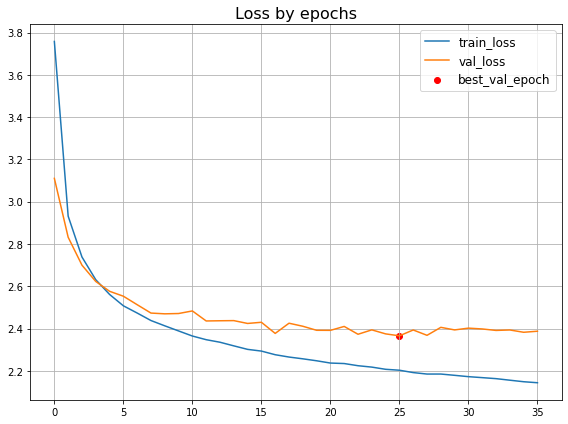

		|   #	| train_loss | val_loss
-------------------------------------------------
Last epoch 	|   36	|   2.1435   |  2.3871
The best epoch 	|   26	|   2.2026   |  2.3654


In [46]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)

HISTORY_3 = defaultdict(list)

n_epochs = 100
n_validation_batches = 32

# the number of epochs on which there is no improvement in the previous result
n_early_stopping = 10

network_graded_3 = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network_graded_3.parameters(), lr=1e-3)

for epoch in range(n_epochs):
    train_img_indices = list(range(n_train))
    np.random.shuffle(train_img_indices)
    batches = np.array_split(train_img_indices, n_train // batch_size)

    train_loss = 0
    network_graded_3.train()
    for batch in batches:
        images, captions = generate_batch_img_idx(train_img_codes, batch, train_captions)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network_graded_3, images, captions)

        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()

        train_loss += loss_t.detach().cpu().numpy()

    train_loss /= len(batches)
    HISTORY_3["train_loss"].append(train_loss)

    val_loss = 0
    network_graded_3.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        with torch.no_grad():
            loss_t = compute_loss(network_graded_3, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    HISTORY_3["val_loss"].append(val_loss)

    HISTORY_3["model_params"].append(network_graded_3.state_dict())

    best_epoch_ = np.argmin(HISTORY_3["val_loss"])

    clear_output()
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    ax.set_title("Loss by epochs", fontsize=16)
    ax.plot(HISTORY_3["train_loss"], label="train_loss")
    ax.plot(HISTORY_3["val_loss"], label="val_loss")
    ax.scatter(x=best_epoch_, y=HISTORY_3["val_loss"][best_epoch_], label="best_val_epoch", color="red")
    ax.grid()
    ax.legend(fontsize=12)

    plt.tight_layout()
    plt.show()

    if (epoch - best_epoch_) >= n_early_stopping:
        break

network_graded_3 = CaptionNet(n_tokens).to(DEVICE)
network_graded_3.load_state_dict(HISTORY_3["model_params"][best_epoch_])

last_tr_loss = round(HISTORY_3["train_loss"][epoch], 4)
last_val_loss = round(HISTORY_3["val_loss"][epoch], 4)
best_tr_loss = round(HISTORY_3["train_loss"][best_epoch_], 4)
best_val_loss = round(HISTORY_3["val_loss"][best_epoch_], 4)

print("\t\t|   #\t| train_loss | val_loss")
print("-------------------------------------------------")
print(f"Last epoch \t|   {epoch + 1}\t|   {last_tr_loss}   |  {last_val_loss}")
print(f"The best epoch \t|   {best_epoch_ + 1}\t|   {best_tr_loss}   |  {best_val_loss}")

In [49]:
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)

for i in range(n_test):
    img_caption = generate_caption(test_img[i], network_graded_3, t=5.0)
    print(f"Image_{i+1} caption:", img_caption)


Image_1 caption: a double decker bus parked on the side of the street .
Image_2 caption: a black bear is standing in the grass .
Image_3 caption: a glass of wine sitting on a table .
Image_4 caption: a statue of a man holding a skateboard .
Image_5 caption: a car parked on a street with a stop sign on the side .
Image_6 caption: a man riding a horse in a fenced in area .
Image_7 caption: a man is standing on a beach with a frisbee .
Image_8 caption: a clock tower with a clock on the top of it .
Image_9 caption: a woman sitting on a chair holding a wii remote .
Image_10 caption: a scooter parked in front of a building .
Image_11 caption: a group of people sitting at a table with laptops .
Image_12 caption: a little boy playing soccer with a soccer ball .
Image_13 caption: a man and woman cutting a cake together .
Image_14 caption: a group of people standing around a table .
Image_15 caption: a bathroom with a toilet and a sink .
Image_16 caption: a giraffe standing in a field of grass .

## Fourth task

 Mobile devices are not very powerfull. Try reducing network size (emb_size=64, lstm_units=128), how it affected network quality after 12 epoches in comparison to original network? And visually?

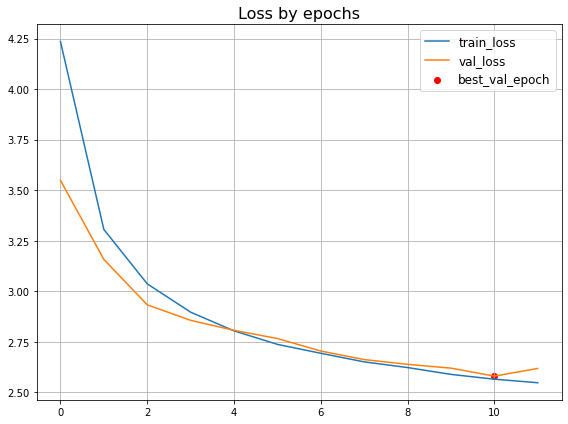

		|   #	| train_loss | val_loss
-------------------------------------------------
Last epoch 	|   12	|   2.5476   |  2.6182
The best epoch 	|   11	|   2.5651   |  2.5802


In [50]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)

HISTORY_4 = defaultdict(list)

n_epochs = 12
n_validation_batches = 16
network_graded_4 = CaptionNet(n_tokens, emb_size=64, lstm_units=128).to(DEVICE)
optimizer = torch.optim.Adam(network_graded_4.parameters(), lr=1e-3)


for epoch in range(n_epochs):
    train_img_indices = list(range(n_train))
    np.random.shuffle(train_img_indices)
    batches = np.array_split(train_img_indices, n_train // batch_size)

    train_loss = 0
    network_graded_4.train()
    for batch in batches:
        images, captions = generate_batch_img_idx(train_img_codes, batch, train_captions)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network_graded_4, images, captions)

        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()

        train_loss += loss_t.detach().cpu().numpy()

    train_loss /= len(batches)
    HISTORY_4["train_loss"].append(train_loss)

    val_loss = 0
    network_graded_4.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        with torch.no_grad():
            loss_t = compute_loss(network_graded_4, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    HISTORY_4["val_loss"].append(val_loss)

    HISTORY_4["model_params"].append(network_graded_4.state_dict())

    best_epoch_ = np.argmin(HISTORY_4["val_loss"])

    clear_output()
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    ax.set_title("Loss by epochs", fontsize=16)
    ax.plot(HISTORY_4["train_loss"], label="train_loss")
    ax.plot(HISTORY_4["val_loss"], label="val_loss")
    ax.scatter(x=best_epoch_, y=HISTORY_4["val_loss"][best_epoch_], label="best_val_epoch", color="red")
    ax.grid()
    ax.legend(fontsize=12)

    plt.tight_layout()
    plt.show()

last_tr_loss = round(HISTORY_4["train_loss"][epoch], 4)
last_val_loss = round(HISTORY_4["val_loss"][epoch], 4)
best_tr_loss = round(HISTORY_4["train_loss"][best_epoch_], 4)
best_val_loss = round(HISTORY_4["val_loss"][best_epoch_], 4)

print("\t\t|   #\t| train_loss | val_loss")
print("-------------------------------------------------")
print(f"Last epoch \t|   {epoch + 1}\t|   {last_tr_loss}   |  {last_val_loss}")
print(f"The best epoch \t|   {best_epoch_ + 1}\t|   {best_tr_loss}   |  {best_val_loss}")



In [52]:
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)

for i in range(n_test):
    img_caption = generate_caption(test_img[i], network_graded_4, t=5.0)
    print(f"Image_{i+1} caption:", img_caption)


Image_1 caption: a bus is driving down a street in a city .
Image_2 caption: a bear is walking through the woods .
Image_3 caption: a glass of wine is on the table .
Image_4 caption: a bird is standing on a wooden table .
Image_5 caption: a person riding a bike on a city street .
Image_6 caption: a man riding a horse on a horse
Image_7 caption: a man in a field with a frisbee in the background .
Image_8 caption: a clock tower with a clock on top of it .
Image_9 caption: a woman with a remote control in her hand .
Image_10 caption: a black and white photo of a street with a clock on it
Image_11 caption: a group of people sitting around a table
Image_12 caption: a man in a white shirt and a frisbee
Image_13 caption: a woman sitting at a table with a cake .
Image_14 caption: a group of people are sitting on a table .
Image_15 caption: a bathroom with a toilet and a sink .
Image_16 caption: a giraffe standing in a field with a tree in the background .
Image_17 caption: a black and white ca

## Results

Let's show the results of generating captions for all four models on the test sample:


DESCRIPTION:
[NN1] - neural network trained on 6 epochs
[NN2] - neural network trained on 12 epochs
[NN3] - neural network trained on optimal number epochs (26 epochs)
[NN4] - light neural network for mobile (12 epochs)
--------------------------------------------------------------------



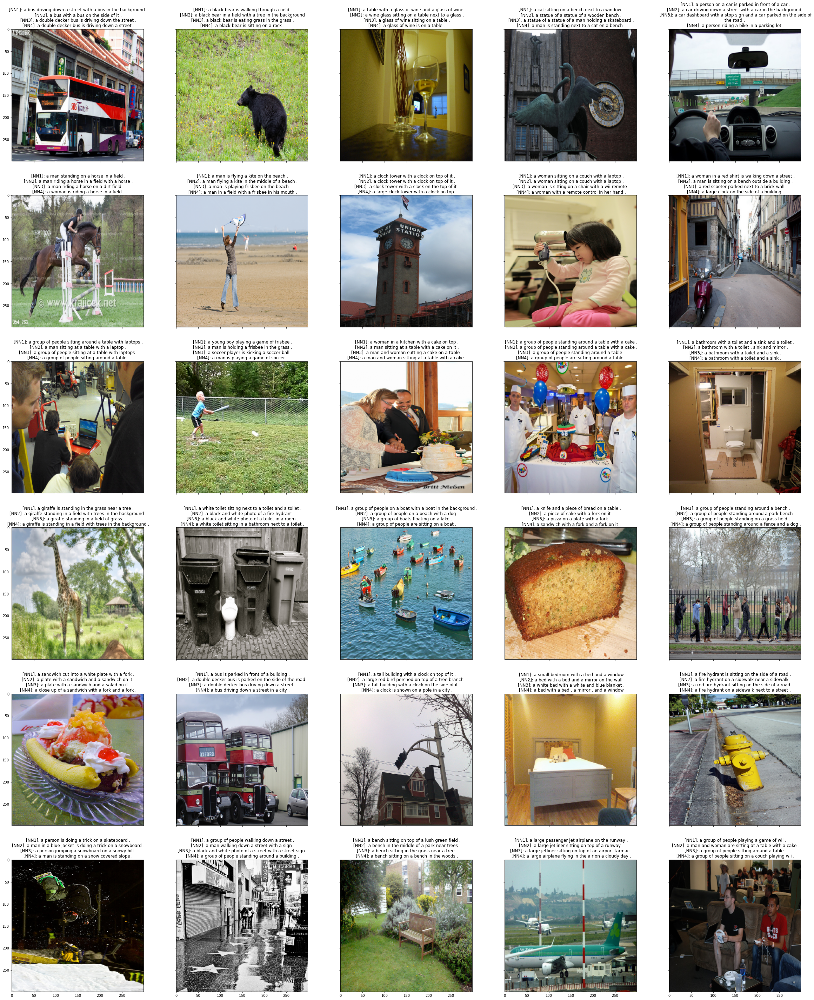

In [78]:
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)

print("DESCRIPTION:")
print("[NN1] - neural network trained on 6 epochs")
print("[NN2] - neural network trained on 12 epochs")
print("[NN3] - neural network trained on optimal number epochs (26 epochs)")
print("[NN4] - light neural network for mobile (12 epochs)")
print("--------------------------------------------------------------------\n")

nrows=6
ncols=5

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True, figsize=(33, 40))
for i in range(n_test):
    img_caption_1 = fill(generate_caption(test_img[i], network_graded_1, t=5.0), width=66)
    img_caption_2 = fill(generate_caption(test_img[i], network_graded_2, t=5.0), width=66)
    img_caption_3 = fill(generate_caption(test_img[i], network_graded_3, t=5.0), width=66)
    img_caption_4 = fill(generate_caption(test_img[i], network_graded_4, t=5.0), width=66)
    img_caption_all = " [NN1]: " + img_caption_1 + "\n" + " [NN2]: " + img_caption_2 + "\n" + " [NN3]: " + img_caption_3 + "\n" + " [NN4]: " + img_caption_4   
    axs[i // ncols, i % ncols].imshow(test_img[i])
    axs[i // ncols, i % ncols].set_title(img_caption_all)
plt.tight_layout()
plt.show()

### Score and Rating (human evaluation)

Let's evaluate the quality of the generated captions:
1. For each test image, we will compare the captions generated by the four networks: *NN1*, *NN2*, *NN3*, *NN4*.
2. We will assign a score from 1 to 4 to each neural network, depending on the quality of the generated captions: where 1 - the best caption, 4 - the worst caption. If the captions are the same in meaning, then the neural networks will be assigned the same scores.
3. The final rating for each neural network is calculated by the formula: *`a`*` x `**`score`**` + `*`b`*, where *`a=-1/90`* and *`b=4/3`* are the normalization coefficients.  
Then the maximum possible rating will be 1 (for sum_score=30 - the best model), and the minimum possible will be 0 (for sum_score=120 - the worst model)

In [11]:
import pandas as pd
df = pd.read_csv('NN_score.csv')
df

,id_image,NN1_caption,NN2_caption,NN3_caption,NN4_caption,NN1_score,NN2_score,NN3_score,NN4_score
0,1,a bus driving down a street next to a building .,a bus that is sitting in the street .,a double decker bus parked on the side of the ...,a bus is driving down a street in a city .,1,2,1,1
1,2,a black bear walking through a grassy area .,a black bear standing on a grass field .,a black bear is standing in the grass .,a bear is walking through the woods .,1,1,1,2
2,3,a table with a glass of wine on it .,a glass of wine and a glass of wine .,a glass of wine sitting on a table .,a glass of wine is on the table .,1,2,2,1
3,4,a cat sitting on a bench next to a window .,a statue of a statue of a statue of a statue o...,a statue of a man holding a skateboard .,a bird is standing on a wooden table .,4,2,3,1
4,5,a man standing on a cell phone in front of a b...,a car that is sitting in the street .,a car parked on a street with a stop sign on t...,a person riding a bike on a city street .,4,2,1,3
5,6,a woman is riding a horse in a field .,a man riding a horse on a track .,a man riding a horse in a fenced in area .,a man riding a horse on a horse,1,3,2,1
6,7,a man is flying a kite on a beach .,a man flying a kite on a beach .,a man is standing on a beach with a frisbee .,a man in a field with a frisbee in the backgro...,1,1,2,3
7,8,a clock tower with a clock on top of it .,a clock tower with a clock on it.,a clock tower with a clock on the top of it .,a clock tower with a clock on top of it .,1,1,1,1
8,9,a woman is sitting on a couch with a remote .,a woman sitting on a couch with a cell phone .,a woman sitting on a chair holding a wii remote .,a woman with a remote control in her hand .,2,2,1,1
9,10,a woman sitting on a bench with a car .,a red fire hydrant sitting in the middle of a ...,a scooter parked in front of a building .,a black and white photo of a street with a clo...,4,3,1,2


In [52]:
NN1_raiting = (-1/90) * df['NN1_score'].sum() + (4/3)
NN2_raiting = (-1/90) * df['NN2_score'].sum() + (4/3)
NN3_raiting = (-1/90) * df['NN3_score'].sum() + (4/3)
NN4_raiting = (-1/90) * df['NN4_score'].sum() + (4/3)

print(" Neural Network   |  Score  |  Raiting")
print("----------------------------------------")
print(f" NN1 (6 epochs)   |    {df['NN1_score'].sum()}   |  {round(NN1_raiting, 3)}")
print(f" NN2 (12 epochs)  |    {df['NN2_score'].sum()}   |  {round(NN2_raiting, 3)}")
print(f" NN3 (26 epochs)  |    {df['NN3_score'].sum()}   |  {round(NN3_raiting, 3)}")
print(f" NN4 (for mobile) |    {df['NN4_score'].sum()}   |  {round(NN4_raiting, 3)}")


 Neural Network   |  Score  |  Raiting
----------------------------------------
 NN1 (6 epochs)   |    58   |  0.689
 NN2 (12 epochs)  |    57   |  0.7
 NN3 (26 epochs)  |    43   |  0.856
 NN4 (for mobile) |    56   |  0.711


### Human evaluation results

1. We got that the best model in terms of the quality of a human evaluation is **`NN3`**, which was trained on the optimal number of epochs.
2. Networks trained on 12 epochs (full **`NN2`** and light mobile **`NN4`**) are about the same in raiting.
3. The model trained on 6 epochs (**`NN1`**) showed the worst expected result.

## Fifth task

Collect at least 10 images that you like to test our network on.
   - Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
   - Make sure it works okay on simple images before going to something more complex
   - Photos, not animation/3d/drawings, unless you want to train CNN network on anime
   - Mind the aspect ratio
   - Photos should not be from MSCOCO! Collect some data yourself, take anything you find worth testing on

In [70]:
### YOUR IMAGES COLLECTING CODE
! wget https://upload.wikimedia.org/wikipedia/ru/2/24/Lenna.png -O data/img1.jpg
! wget https://sun9-23.userapi.com/c6065/u143604106/video/l_990f3681.jpg -O data/img2.jpg
! wget https://wallbox.ru/resize/800x480/wallpapers/main/201601/62fe55c21cbab02.jpg -O data/img3.jpg
! wget https://i.ytimg.com/vi/Pvl2cPHdahw/hqdefault.jpg -O data/img4.jpg
! wget http://clio-mgu.bump.ru/resources/000/000/000/001/189/1189256_1024x768.jpg -O data/img5.jpg
! wget https://s00.yaplakal.com/pics/pics_preview/8/1/4/15143418.jpg -O data/img6.jpg
! wget https://i.pinimg.com/736x/0d/b8/33/0db833e4379dcf1173270c50b8dec4d6.jpg -O data/img7.jpg
! wget https://techgage.com/wp-content/uploads/2017/05/NVIDIA-Tesla-V100-Data-Center-Full-sized-Graphics-Card.jpg -O data/img8.jpg
! wget https://ruchess.ru/upload/iblock/219/2196ed6d28407ee18456e6bfdc1d9b9e.jpg -O data/img9.jpg
! wget https://moldovenii.md/resources/files/photo/3/0/300e57ce4da3fc14a6828b9b722d570a.jpg -O data/img10.jpg
! wget https://i.pinimg.com/736x/14/bb/a5/14bba5e6c2972db0089416f4bcbab1b6.jpg -O data/img11.jpg
! wget https://i.ytimg.com/vi/Cpgx9J48x5k/hqdefault.jpg -O data/img12.jpg



--2021-11-23 12:22:06--  https://upload.wikimedia.org/wikipedia/ru/2/24/Lenna.png
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6212162 (5.9M) [image/png]
Saving to: ‘data/img1.jpg’

data/img1.jpg       100%[===================>]   5.92M  21.7MB/s    in 0.3s    

2021-11-23 12:22:07 (21.7 MB/s) - ‘data/img1.jpg’ saved [6212162/6212162]

--2021-11-23 12:22:07--  https://sun9-23.userapi.com/c6065/u143604106/video/l_990f3681.jpg
Resolving sun9-23.userapi.com (sun9-23.userapi.com)... 93.186.227.134
Connecting to sun9-23.userapi.com (sun9-23.userapi.com)|93.186.227.134|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15617 (15K) [image/jpeg]
Saving to: ‘data/img2.jpg’

data/img2.jpg       100%[===================>]  15.25K  --.-KB/s    in 0s      

2021-11-23 12:22:08 (187 MB/


Image_1:
a woman wearing a hat and holding a blue umbrella .
a woman wearing a hat and holding a white umbrella .
a woman wearing a hat and scarf holding a white umbrella .
a woman wearing a hat and holding a blue umbrella .
a woman wearing a hat and a hat .


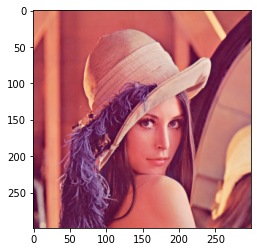


Image_2:
a man is holding a remote control in his hand .
a man is taking a picture of himself in the mirror .
a man is holding a cell phone to his ear .
a man is holding a cell phone in his hand .
a man is holding a cell phone in his hand .


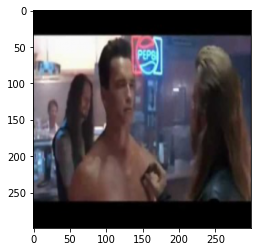


Image_3:
a bowl of fruit is sitting on a table .
a bowl of fruit with a spoon in it .
a bowl of cereal and a banana on a table .
a bowl of cereal and apples on a table .
a bowl of cereal and fruit on a table .


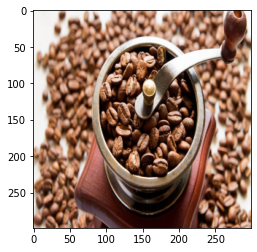


Image_4:
a building with a clock on the side of it .
a building with a clock on the side of it
a building with a clock on the side of it .
a building with a clock on the side of it
a building with a clock on the side of it


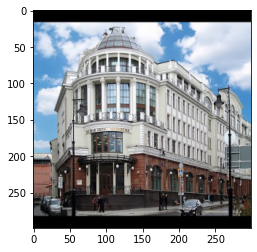


Image_5:
a clock tower in the middle of a city .
a large building with a clock on the side of the building .
a clock tower in the middle of a city .
a clock tower with a large building in the background .
a clock tower with a large building in the background .


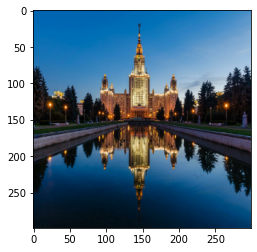


Image_6:
a group of people standing around a tree .
a group of people standing around a tent .
a group of people in costume and ties
a group of people standing around a large tent .
a group of people standing next to each other .


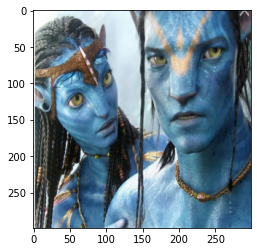


Image_7:
a woman on a surfboard riding a wave .
a woman is riding a wave on a surfboard .
a man riding a wave on a surfboard .
a woman is riding a wave on a surfboard .
a woman in a bikini riding a surfboard .


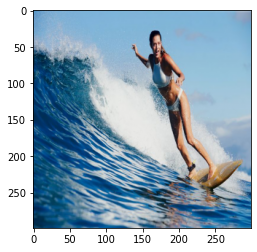


Image_8:
a group of people standing on top of a boat .
a group of people standing on top of a ski lift .
a black and white photo of a ski lift .
a group of people standing on top of a ski lift .
a group of people standing next to each other .


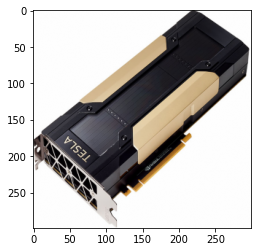


Image_9:
a man and woman are sitting on a bench .
a man and woman are standing in front of a store .
a man and woman are standing in front of a projector screen .
a man and woman are standing in front of a store .
a man and woman are standing in front of a store .


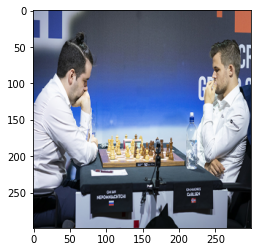


Image_10:
a man is on a skateboard in the air .
a man in a red shirt is riding a skateboard .
a man on a skateboard is jumping in the air .
a man in a red shirt is riding a skateboard .
a man on a skateboard is jumping in the air .


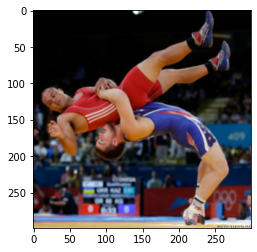


Image_11:
a cat laying in a bathroom sink with a toothbrush .
a white cat is laying down on a white board .
a white cat laying on top of a blue towel .
a cat is laying down on a white towel .
a cat that is laying down on a bed .


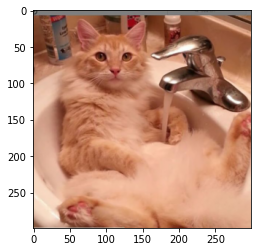


Image_12:
a panda bear is sitting on a rock .
a panda bear is sitting on a rock .
a panda bear is sitting on a rock .
a panda bear is sitting on a rock .
a panda bear is sitting on a rock .


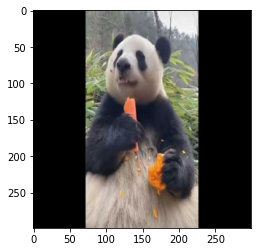

In [79]:
### YOUR CAPTIONS GENERATING CODE

data_imgs =[]
for i in range(12):
    data_name = 'data/img' + str(i+1) + '.jpg'
    data_imgs.append(data_name)


for i in range(len(data_imgs)):
    img = plt.imread(data_imgs[i])
    img = resize(img, (299, 299))
    
    print(f"\nImage_{i+1}:")
    
    for _ in range(5):
        print(generate_caption(img, network_graded_3, t=5.0))
        
    plt.imshow(img)
    plt.show();


### Results

1. We see that in arbitrary pictures the model is often mistaken and cannot recognize some objects (for example, GPU Tesla V100).
2. At the same time, the model recognizes people and animals quite well. However, model still confuses men and women (Ian Nepomniachtchi vs Magnus Carlsen).

---

*Prepared by Sergey Afanasiev*